# Project 4: Advanced Lane Finding

## Overview
In this project we would improve our technique for finding road lanes and curvature of the lanes. In order to do this, we would use a series of steps, outlined below:

1. Camera Calibration
2. Distortion Correction
3. Color and Gradient Thresholds
4. Perspective Transform
5. Detect Lane Lines
6. Determine Lane Curvature
7. Apply these techniques to the frames of the video

We will proceed step by step, showing partial results (on frames/images from video) along the way, to see how each step is helping achieve our ultimate goal.

In [22]:
# Imports
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import os

## 2. Distortion Correction

Now that we calculated the camera matrix in the other notebook, we will conveniently load the parameters here from the *pickled* file. 

In [4]:
calibration_params_file = 'dist_pickle.p'

with open(calibration_params_file, 'rb') as f:
    calibration_params = pickle.load(f)

mtx = calibration_params["mtx"]
dist = calibration_params["dist"]

Now let's test and see that the params are correct.

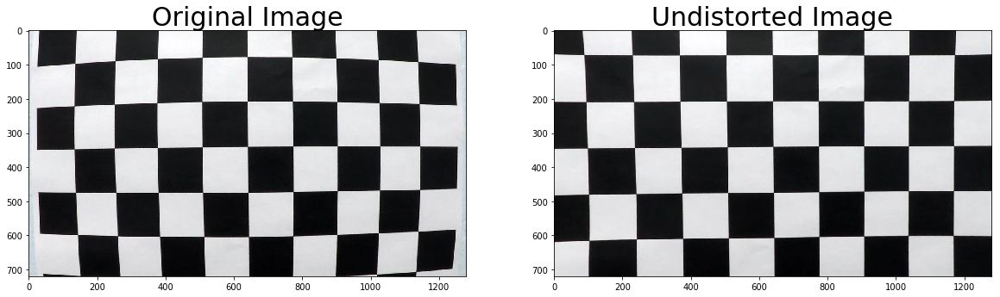

In [9]:
%matplotlib inline

img = cv2.imread('camera_cal/calibration1.jpg')
undist_img = cv2.undistort(img, mtx, dist, None, mtx)

#Display a comparison between the distorted and undistorted images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist_img)
ax2.set_title('Undistorted Image', fontsize=30)

Ok! Seems like our parameters were properly saved in the *pickled* file and we properly restored them from there. Before we move on to the next steps, let's just make a helper function that will undistort a given image.

In [10]:
def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

## 3. Color and Gradient Thresholds

Now we move on to applying some different color spaces and gradient thresholds to the images.

In [52]:
os.listdir("test_images/")

['challenge_lines1.jpg',
 'challenge_lines2.jpg',
 'harder_challenge_lines1.jpg',
 'harder_challenge_lines2.jpg',
 'harder_challenge_lines3.jpg',
 'harder_challenge_lines4.jpg',
 'harder_challenge_lines5.jpg',
 'harder_challenge_lines6.jpg',
 'harder_challenge_lines7.jpg',
 'harder_challenge_lines8.jpg',
 'straight_lines1.jpg',
 'straight_lines2.jpg',
 'test1.jpg',
 'test2.jpg',
 'test3.jpg',
 'test4.jpg',
 'test5.jpg',
 'test6.jpg']

Let's see how the HSV and HLS color spaces behave on some of the test images that we have.

challenge_lines1.jpg


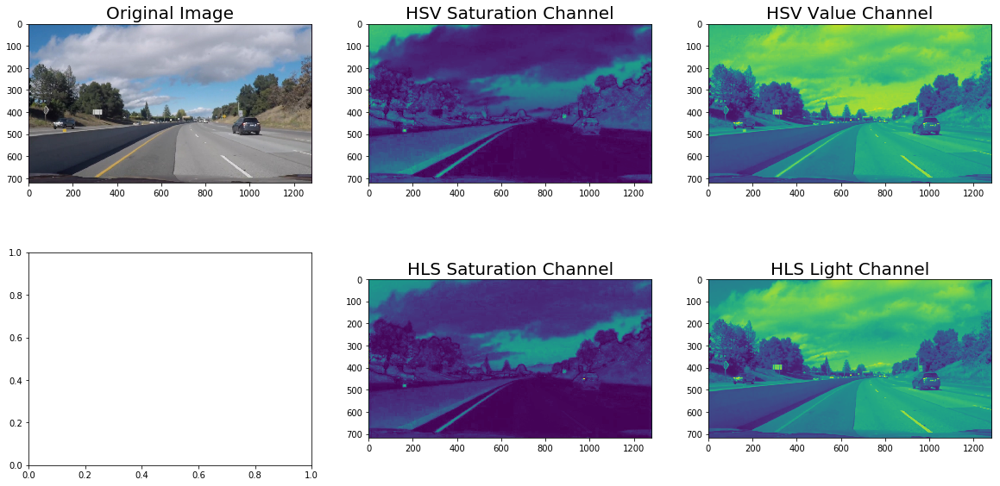

challenge_lines2.jpg


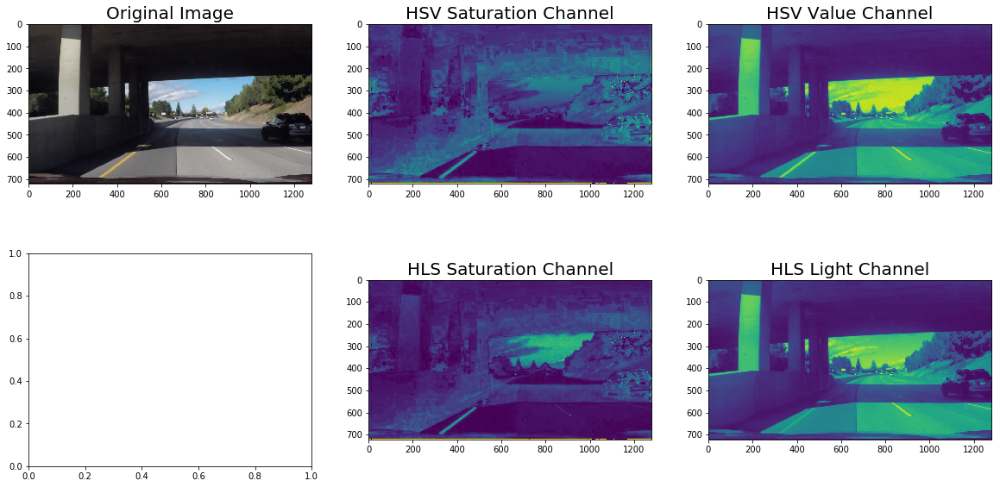

harder_challenge_lines1.jpg


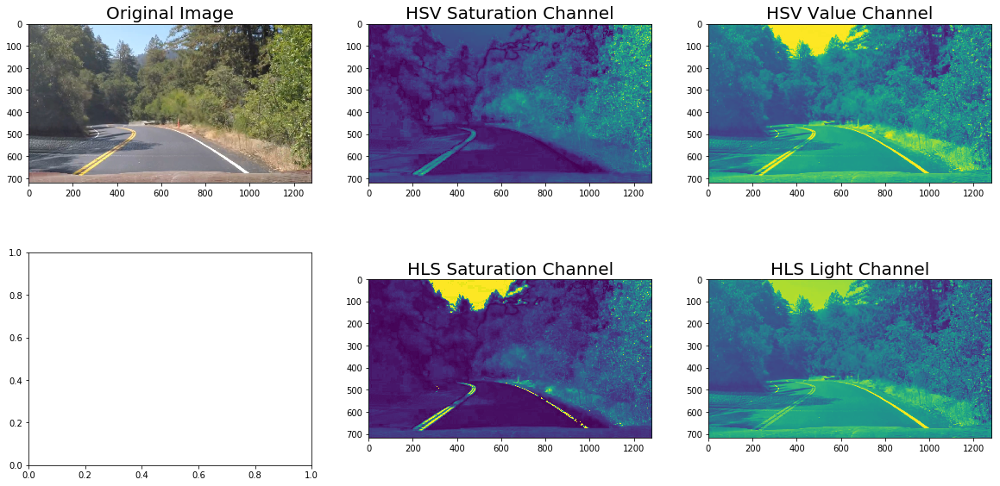

harder_challenge_lines2.jpg


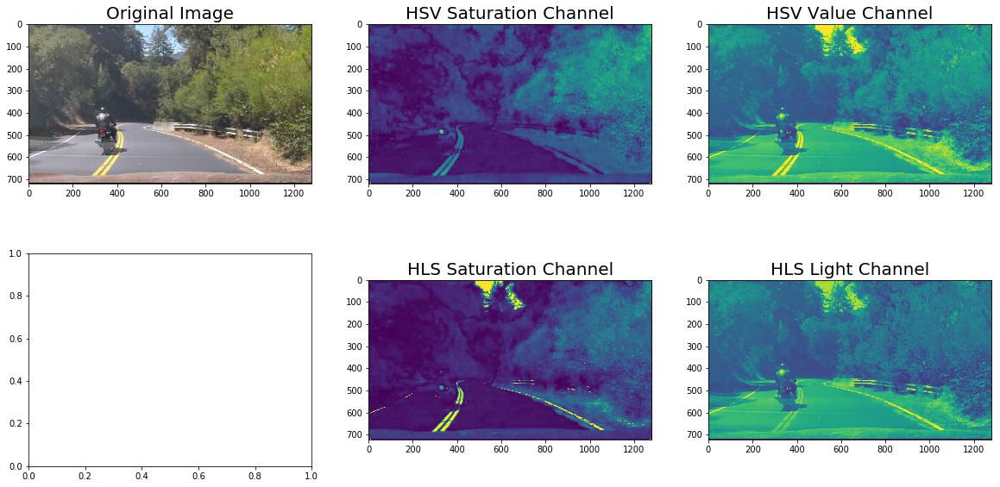

harder_challenge_lines3.jpg


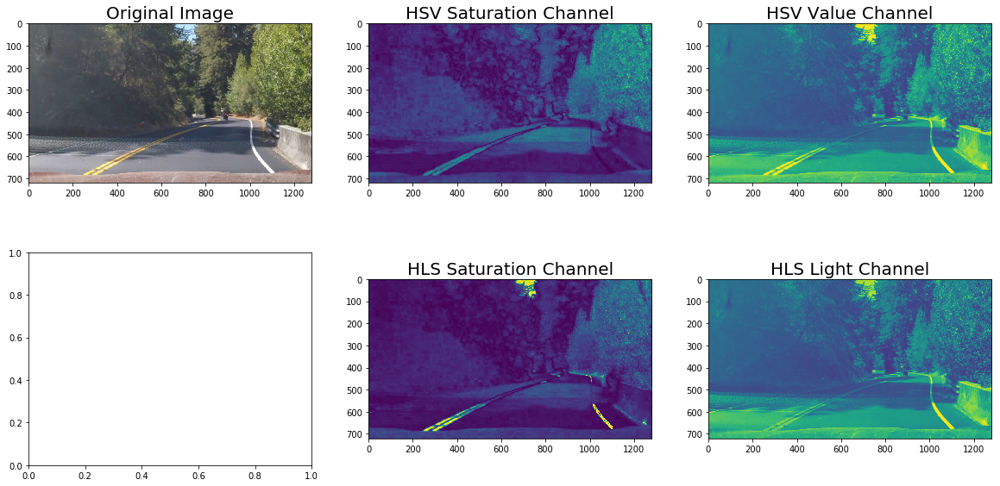

harder_challenge_lines4.jpg


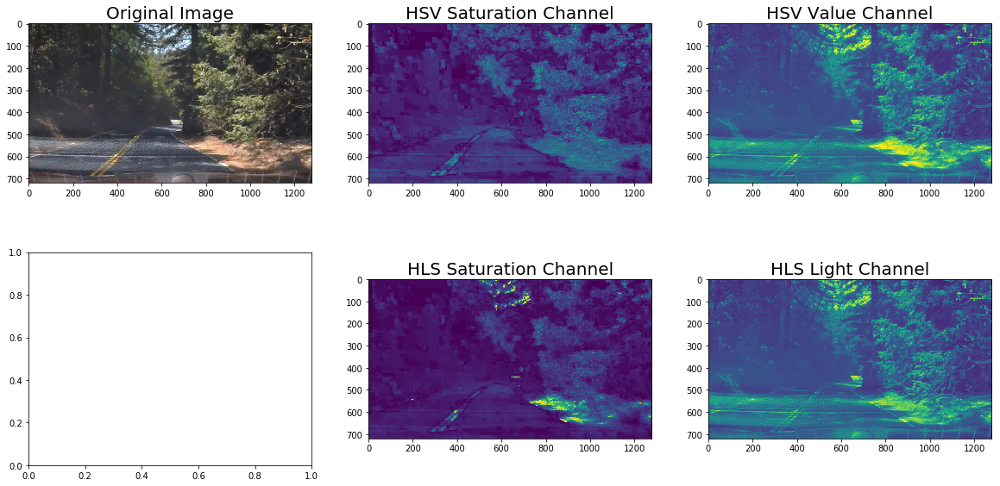

harder_challenge_lines5.jpg


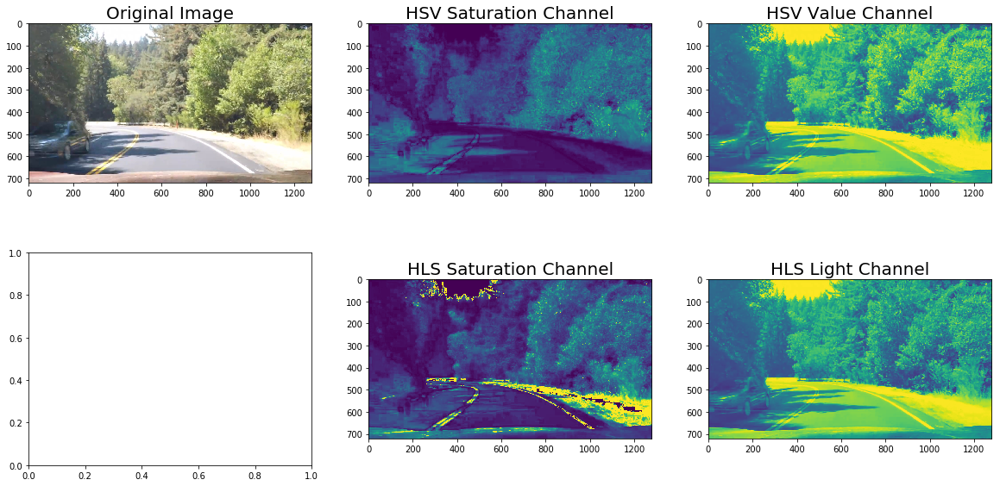

harder_challenge_lines6.jpg


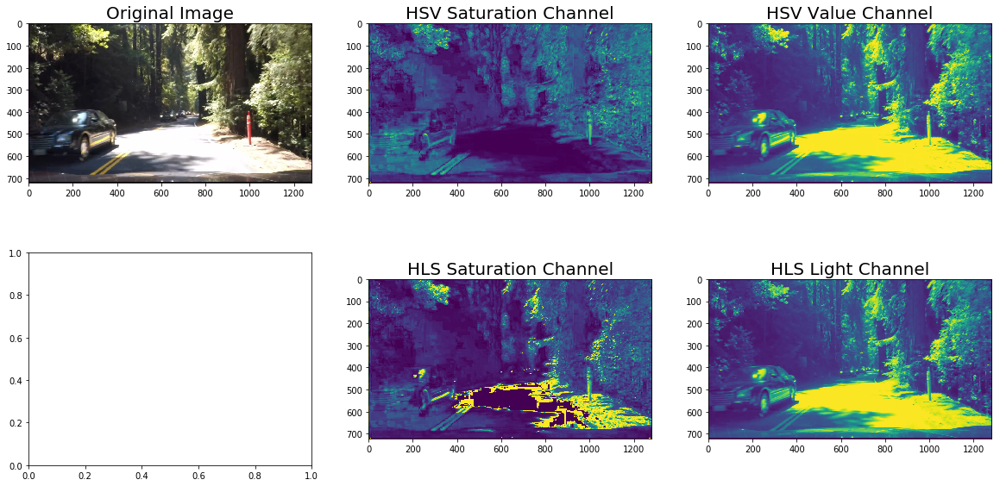

harder_challenge_lines7.jpg


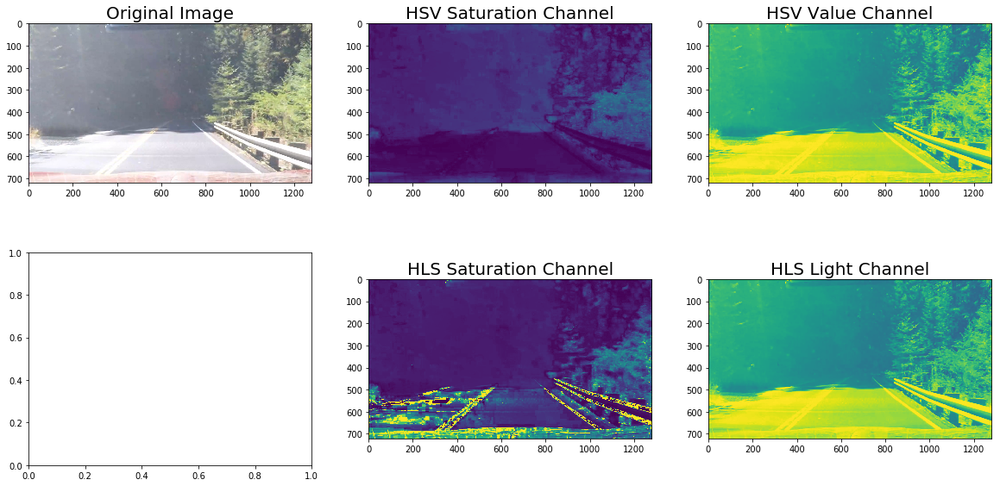

harder_challenge_lines8.jpg


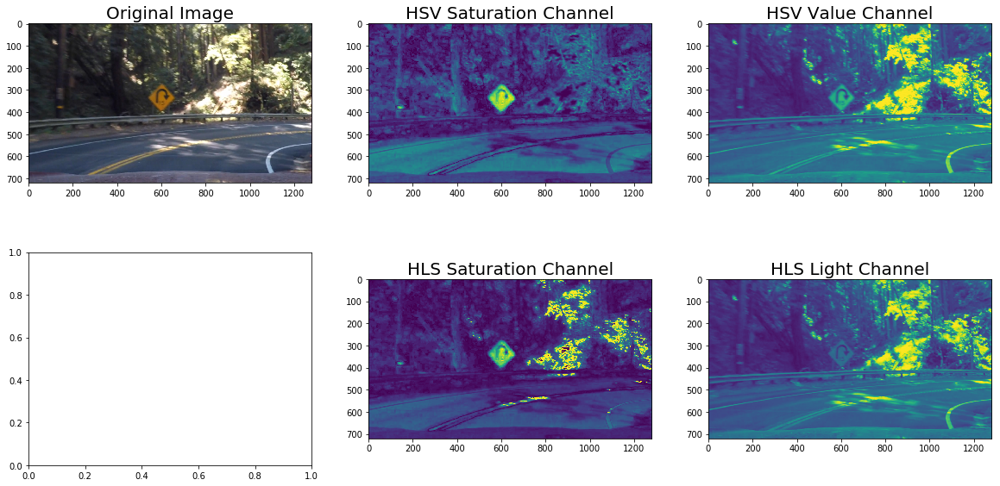

straight_lines1.jpg


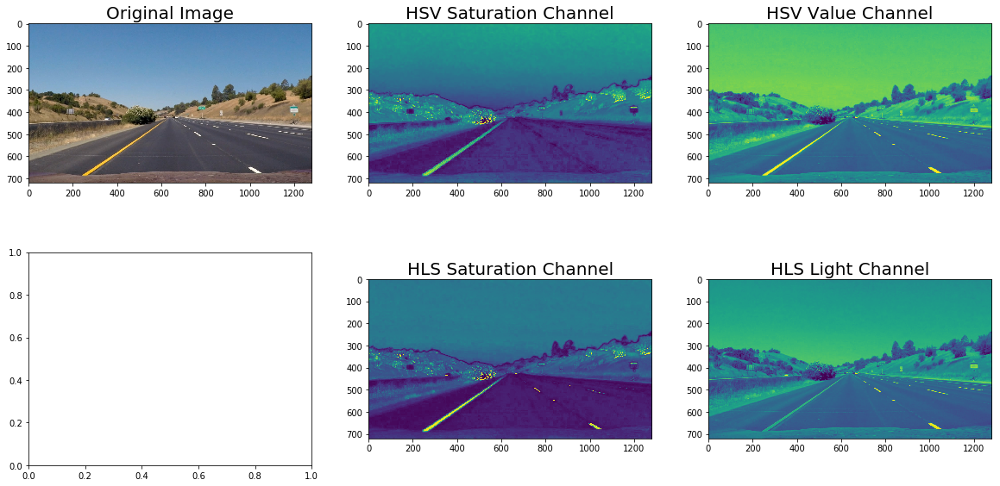

straight_lines2.jpg


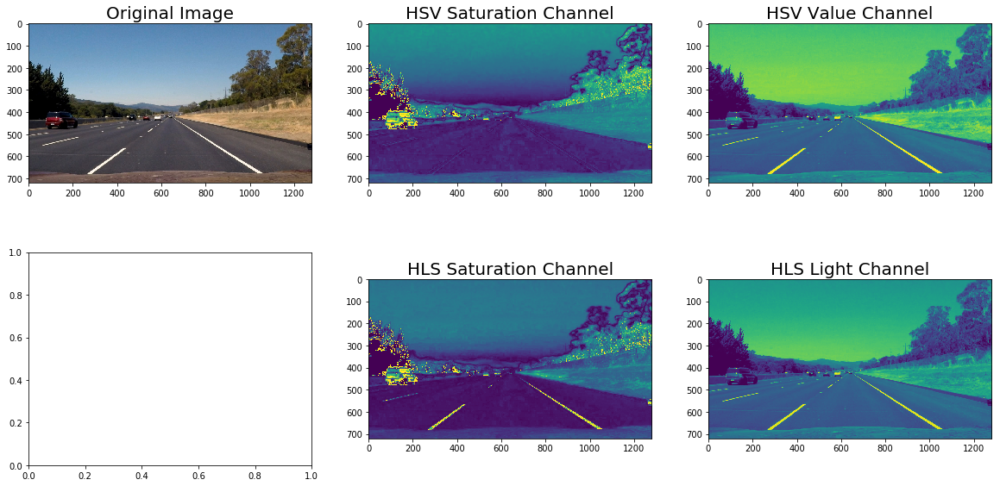

test1.jpg


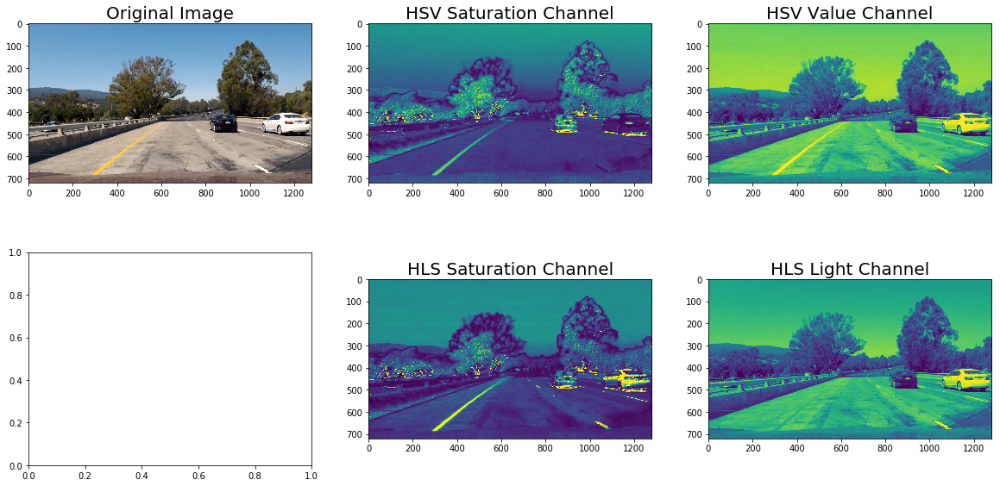

test2.jpg


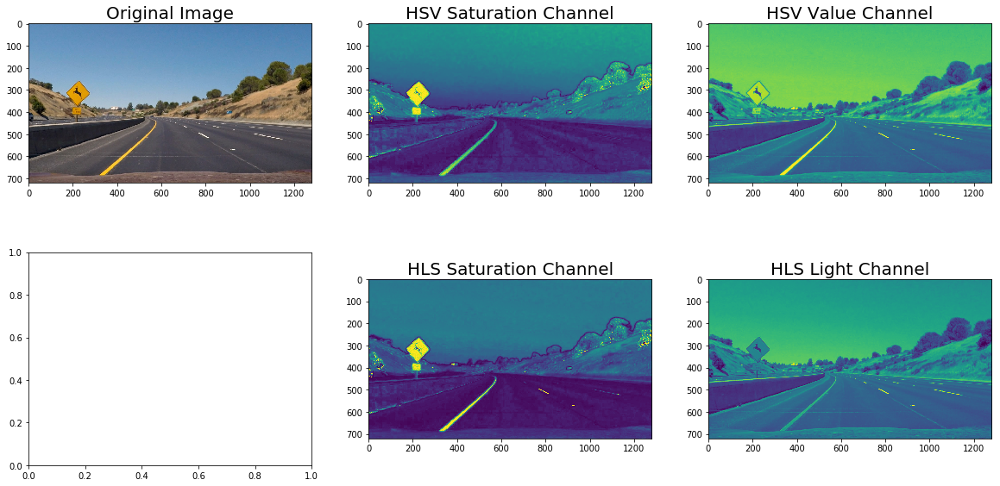

test3.jpg


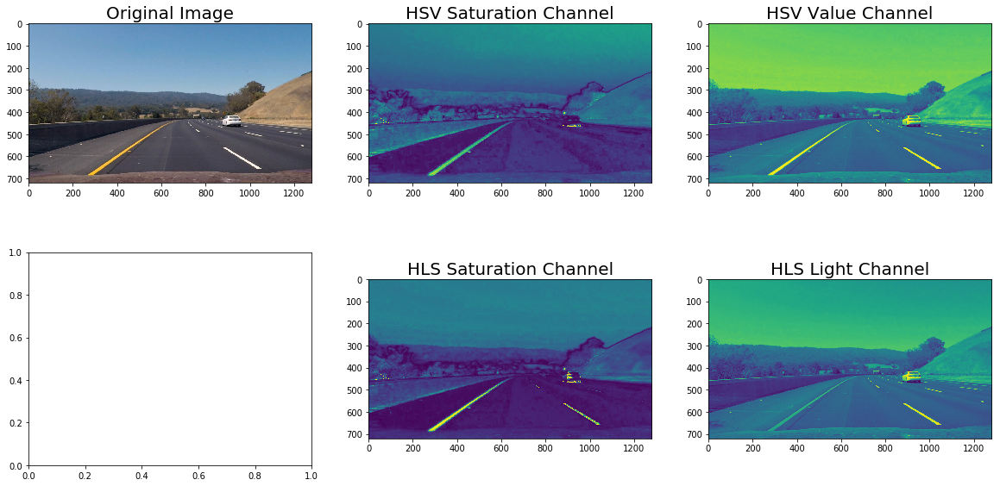

test4.jpg


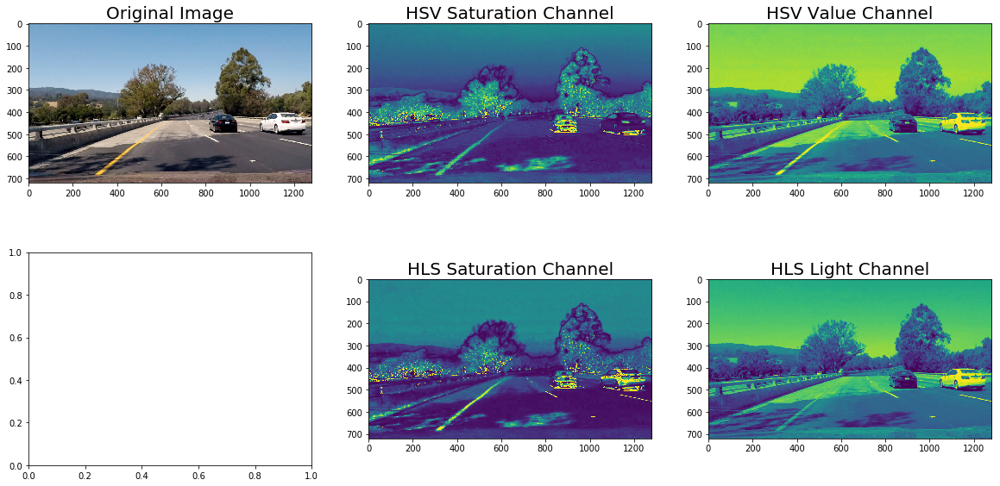

test5.jpg


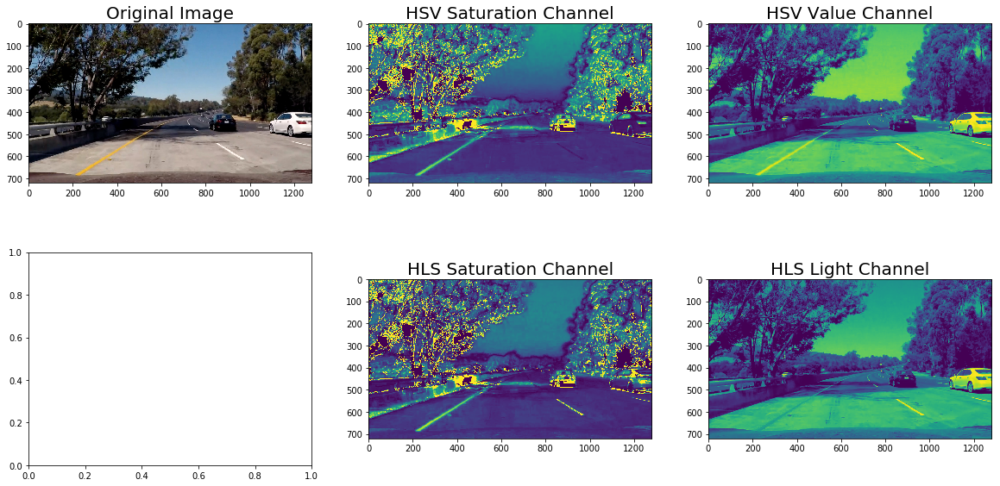

test6.jpg


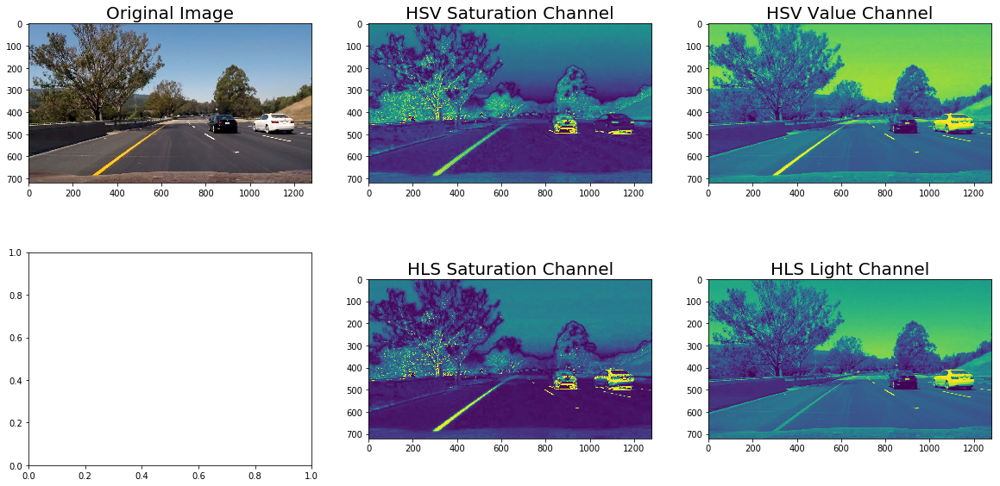

In [55]:
# Investigate HSV and HLS on some test images
for image_name in os.listdir('test_images/'):
    print(image_name)
    
    img = mpimg.imread('test_images/' + image_name)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    
    f, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(20, 10))
    
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(hsv[:,:,1])
    ax2.set_title('HSV Saturation Channel', fontsize=20)
    ax3.imshow(hsv[:,:,2])
    ax3.set_title('HSV Value Channel', fontsize=20)
    ax5.imshow(hls[:,:,2])
    ax5.set_title('HLS Saturation Channel', fontsize=20)
    ax6.imshow(hls[:,:,1])
    ax6.set_title('HLS Light Channel', fontsize=20)
    plt.show()

After seeing some of the examples, it is clear that the **Saturation** channels from HSV and HLS are different and produce different results. That being said, it seems like the **HLS Saturation** and **HSV Value** channels are the ones that produce the most consistent results in terms of highlighting the lines. Therefore, we will move on with some thresholding experiments on them.

Let's create a mask that isolates the *region of interest* (i.e. where the lane lines could possible be) from the other noise in the image (i.e. remove sky and surroundings).

In [60]:
# Create helper function to return region of interest
def roi(img):
    roi_img = np.copy(img)
    roi_img[:int(y/1.75)] = 0
    roi_img[(y-50):] = 0
    
    return roi_img

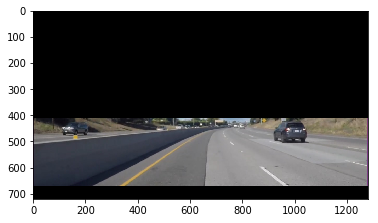

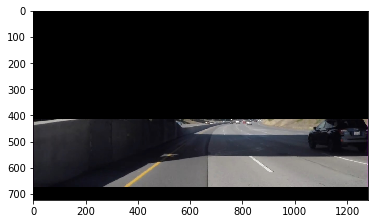

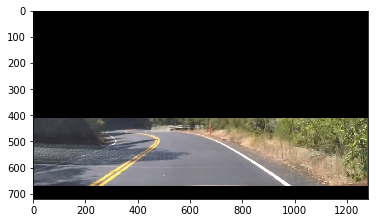

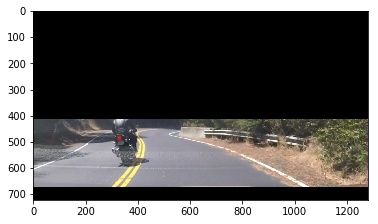

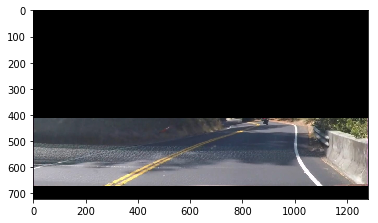

...

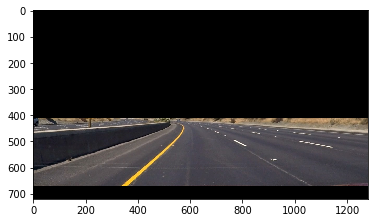

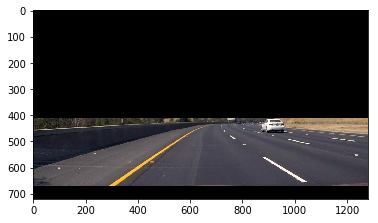

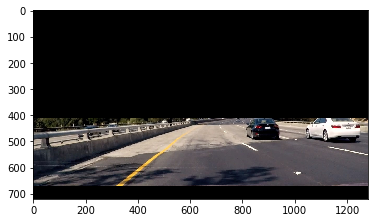

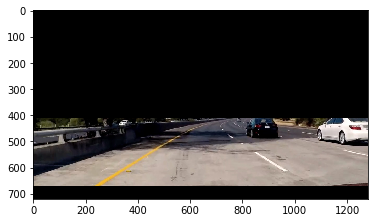

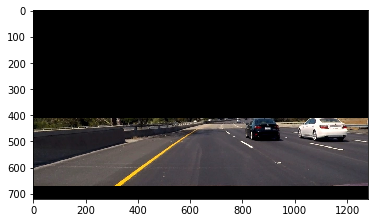

In [61]:
# Test the region of interest helper
for image_name in os.listdir('test_images/'):
    #print(image_name)
    
    img = mpimg.imread('test_images/' + image_name)
    #img = mpimg.imread('test_images/test1.jpg')
    (y, x, _) = img.shape

    img = roi(img)

    plt.imshow(img)
    plt.show()

Now we want to put together the color spaces with the region of interest and play around with thresholds and gradients to properly extract the lane lines.

In [62]:
def lines_preprocessing(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    copy = np.copy(img)
    
    # Convert image to both HSV and HLS as described above
    hsv = cv2.cvtColor(copy, cv2.COLOR_RGB2HSV).astype(np.float)
    hls = cv2.cvtColor(copy, cv2.COLOR_RGB2HLS).astype(np.float)
    
    # Grab the HLS Saturation channel
    s_channel = hls[:,:,2]
    # Grab the HSV Value channel
    v_channel = hsv[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(v_channel, cv2.CV_64F, 1, 0) # Taking the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold Saturation channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, s_binary))
    return color_binary

challenge_lines1.jpg


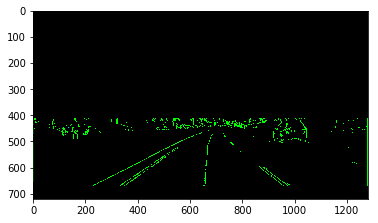

challenge_lines2.jpg


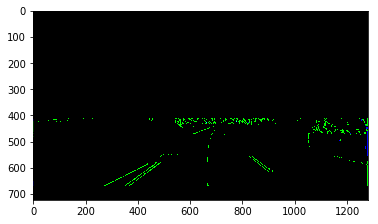

harder_challenge_lines1.jpg


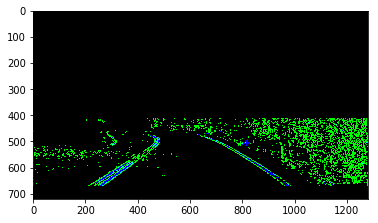

harder_challenge_lines2.jpg


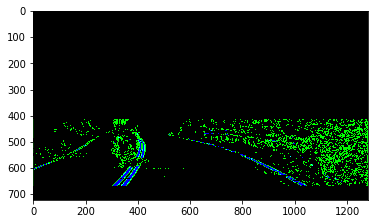

harder_challenge_lines3.jpg


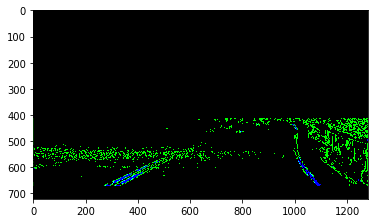

harder_challenge_lines4.jpg


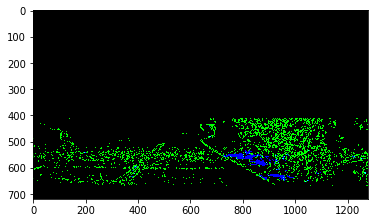

harder_challenge_lines5.jpg


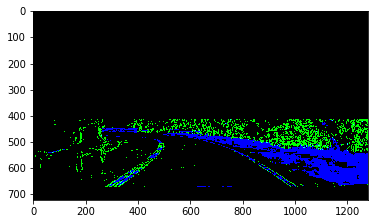

harder_challenge_lines6.jpg


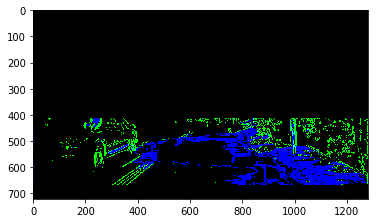

harder_challenge_lines7.jpg


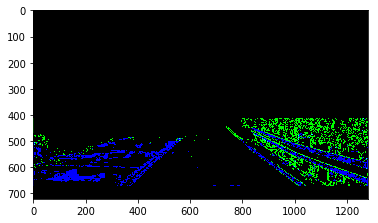

harder_challenge_lines8.jpg


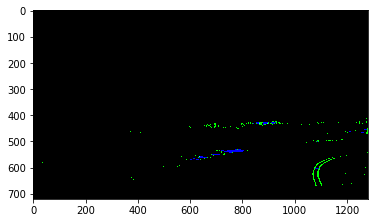

straight_lines1.jpg


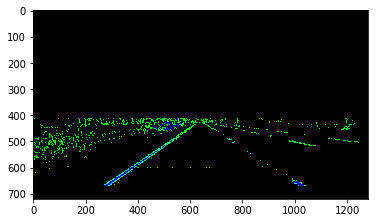

straight_lines2.jpg


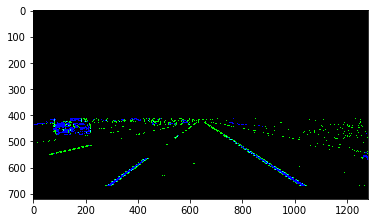

test1.jpg


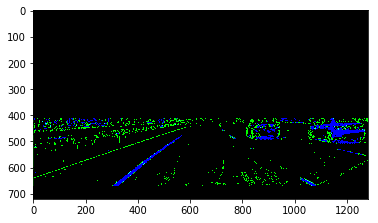

test2.jpg


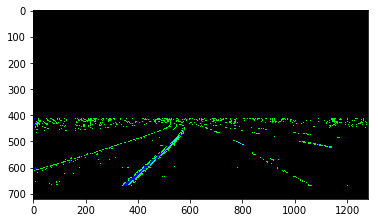

test3.jpg


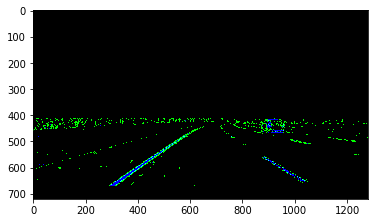

test4.jpg


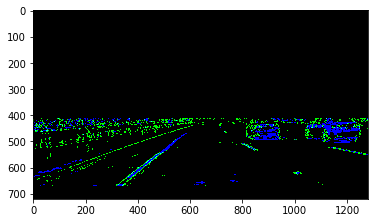

test5.jpg


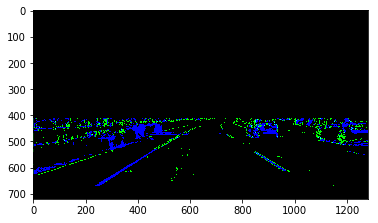

test6.jpg


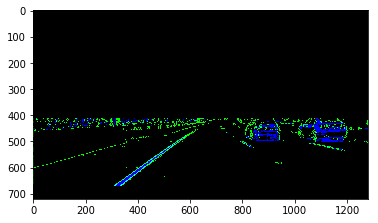

In [65]:
# Investigate HSV and HLS on some test images
for image_name in os.listdir('test_images/'):
    print(image_name)
    
    img = mpimg.imread('test_images/' + image_name)
    result = lines_preprocessing(img)
    result = roi(result)
    
    plt.imshow(result)
    plt.show()